Created on Friday 15 January 2021

**Group 5 - Classification  
New document prediction unsupervised vf**

@authors : Alice Airault, Theo Vedis, Valentine Rossi, Maylin Vuillaume

The aim of the Notebook is to detect articles that provide new information.

# Import libraries

In [ ]:
import re
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from wordcloud import WordCloud, STOPWORDS

from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize

from sklearn.manifold import TSNE
from sklearn.svm import OneClassSVM
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler

nltk.download('stopwords')
nltk.download('punkt')

# Create link between drive and notebook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import data

In [ ]:
# Data without features syntax
data: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/Data_With_Features_Syntax.csv")
data = data.query("art_lang == 'fr'")
data.drop(["art_id", "art_content", "art_content_html", "art_extract_datetime", "art_lang", "art_title",
           "art_url", "src_name", "src_type", "src_url", "src_img", "art_auth", "art_tag", "title_postive_score", "title_negative_score",
           "title_polarity_score", "title_subjectivity_score", "netloc.com", "ratio_word_title_on_word"], axis=1, inplace=True)
data["average_word_sentence"] = data["average_word_sentence"].fillna(0)

In [ ]:
# All data
all_data: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/Data.json")

In [ ]:
# TF-IDF
tf_idf: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/TF-IDF.csv")
tf_idf.drop(tf_idf[all_data['art_lang'] != 'fr'].index, inplace=True)

In [ ]:
# Bag-of-Words (BoW)
bow: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/BOW.csv")
bow.drop(bow[all_data['art_lang'] != 'fr'].index, inplace=True)

In [ ]:
# Bag-of-Words (BoW) - G3
bow_g3: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/g3_BOW_v1.json")

# Create dataframe that with BoW data
data_bow_g3: pd.DataFrame = bow_g3.copy()

# Bag-of-Words (BoW) - G3
bow_g3.drop(["art_id", "art_content_clean_without_lem"], axis=1, inplace=True)

In [ ]:
# Glove
glove_v1: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/GloVe_v1.json")
glove_v1.drop(["art_id", "art_content_clean_without_lem",
               "spacy_vector"], axis=1, inplace=True)

In [ ]:
# Word2vec
word2vec_v0: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/word2vec_v0.json")

# Size of the list to know the number of columns in our word2vec
size_list: int = len(word2vec_v0['vect_art'][0])
df_word2vec: pd.DataFrame = word2vec_v0.copy()

# Create a column for each item in the list
for i in range(size_list):
    col_name: str = str(i)
    df_word2vec[col_name] = df_word2vec['vect_art'].apply(lambda x: x[i])

# Delete unnecessary columns for representation
df_word2vec.drop(['art_id', 'vect_art'], axis=1, inplace=True)

# Functions

## Word cloud with its preprocessing

In [ ]:
# Clean data
def preprocessing(sentence: str) -> str:
    """Documentation
    Parameters:
        data: 1 column of a dataframe especially choose because we want a column who contain only text

    Out (if exists):
        liste_return: Liste of all the text of the dataframe return with preprocessing applied
    """
    stop_words: set = set(stopwords.words('french'))
    pattern: list = ['(', ')', ':', ';', ',', '&', '/',
                     '"', "'", '\n', '©', 'n°', '-']
    if not isinstance(sentence, str):
        sentence: str = str(sentence)

    sentence: str = re.sub(r'\d', ' ', sentence)
    sentence: str = sentence.lower()

    for d in pattern:
        sentence: str = sentence.replace(d, " ")

    token_words: list = word_tokenize(sentence)
    filtre: type = [w for w in token_words if not w in stop_words]

    final_list: str = ""
    for word in filtre:
        final_list: str = final_list + word + " "

    return(final_list)

In [ ]:
# Generates a word cloud for an article
def wordcloud_art(text: str):
    """Documentation
    Parameters:
        text: The article that will be show on the word cloud
    """
    text: str = preprocessing(text)
    if len(text) > 0:
        wordcloud: str = WordCloud(relative_scaling=1.0,).generate(str(text))
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.show()
        plt.close()
    else:
        print("The article have a size of 0.")

In [ ]:
# To visualize texts and their word clouds
def txt_wordcloud(bow_g3: pd.DataFrame, score: list, data_bow_g3: pd.DataFrame):
    """Documentation
    Parameters:
        bow_g3: Bag-of-Word og group 3 
        score: Prediction score of a model with 1 and -1 to say whether the article content is new or not
        data_bow_g3: Dataframe to retrieve article texts
    """
    # Create a new dataframe with the score
    df: pd.DataFrame: pd.DataFrame = bow_g3.copy()
    df['index'] = bow_g3.index
    df['score'] = score

    # Retrieve the text of the articles
    mycolumns: list = ['art_id', 'art_content_clean_without_lem']
    data_bow: pd.DataFrame = data_bow_g3[mycolumns]

    # Merge the text with its decision score
    df_new: pd.DataFrame = pd.merge(
        data_bow, df, left_on='art_id', right_on='index')

    # Sort scores from smallest to largest
    df_sort: pd.DataFrame = df_new.sort_values(by='score')
    df_sort: pd.DataFrame = df_sort.reset_index()
    df_sort: pd.DataFrame = df_sort.drop(['level_0'], axis=1)

    # Display the first 7 most different texts and word clouds
    for i in range(7):
        txt: str = df_sort['art_content_clean_without_lem'][i]
        wordcloud = wordcloud_art(txt)
        print(txt)
        print(wordcloud)

## Visualization 2D or 3D

In [ ]:
# Representation of a PCA in 3D for the first method
def graph_3d(data: pd.DataFrame, prediction: pd.Series, name: tuple = ("New", "Old"), axes: tuple = (0, 1, 2), opacity: tuple = (1, 0.4)):
    """Documentation
    Parameters:
        data: The data that will be show on the plot
        prediction: The prediction that will be used to make distinction bewteen the differents class on the plot
        name: Colunms names
        axes: Axes of pca to display points
        opacity: The transparency of the points on the graph
    """
    # Normalisation
    sc: StandardScaler = StandardScaler()
    X: np.ndarray = sc.fit_transform(data)

    # PCA
    pca: PCA = PCA(n_components=10)
    X: np.ndarray = pca.fit_transform(X)

    # Prediction
    data_plot: pd.DataFrame = pd.DataFrame(X)
    data_plot["prediction"] = prediction.replace([-1, 1], name)

    # Color chart
    data_plot_new: pd.DataFrame = data_plot[data_plot["prediction"] == name[0]]
    data_plot_old: pd.DataFrame = data_plot[data_plot["prediction"] == name[1]]

    # Chart
    data: list = [go.Scatter3d(x=data_plot_old[axes[0]], y=data_plot_old[axes[1]], z=data_plot_old[axes[2]], name=name[1], mode='markers', marker=dict(size=6), opacity=opacity[1]),
                  go.Scatter3d(x=data_plot_new[axes[0]], y=data_plot_new[axes[1]], z=data_plot_new[axes[2]],
                               name=name[0], mode='markers', marker=dict(size=6), opacity=opacity[0]),
                  ]
    fig: go.Figure = go.Figure(data)
    fig.show()

In [ ]:
# Representation of a PCA in 3D or 2D for the second method
def graphs(data: np.ndarray, view: str = '2d'):
    """Documentation
    Parameters:
        data: The t-SNE array
        view: Graph in '2d' or '3d'

    Out:
        Model representation in 2d or 3d 
    """
    # Prediction
    data_plot: pd.DataFrame = pd.DataFrame(data)
    data_plot["prediction"] = pred
    data_plot["pred"] = data_plot["prediction"].apply(
        lambda x: 'Old' if x == 1 else 'New')

    # For color chart
    data_plot_new: pd.DataFrame = data_plot[data_plot["pred"] == "New"]
    data_plot_old: pd.DataFrame = data_plot[data_plot["pred"] == "Old"]

    # Chart
    if view == '2d':
        fig = px.scatter(data_plot, x=0, y=1, color='pred', opacity=0.6)
    elif view == '3d':
        fig = px.scatter_3d(data_plot, x=0, y=1, z=2,
                            color='pred', opacity=0.7)
    fig.show()

## Duplicate prediction

In [ ]:
# A prediction for a Forest Insulation model emerges
def duplicate_prediction(data_path: str) -> np.ndarray:
    """Documentation
    Parameters:
        data_path: Path to data

    Out:
        prediction: List of prediction (-1 : News, 1: Common)
    """
    # Load data
    data: pd.DataFrame = None
    format: str = data_path.split(".")[-1]
    if format == "csv":
        data: pd.DataFrame = pd.read_csv(data_path)
    if format == "json":
        data: pd.DataFrame = pd.read_json(data_path)
    if data is None:
        raise Exception("Data format error, " + format +
                        " not supported (only csv or json)")

    # Prediction
    clf: IsolationForest = IsolationForest(random_state=0, contamination=0.005)
    prediction: np.ndarray = clf.fit_predict(data)

    return prediction

# Method 1 (v0):

**Methodology :**  
  The first method chosen to solve the objective stated in the introduction, was to take different vector representations describing the articles. Some were provided by non-alternators such as Term Frequency Inverse Data Frequency (TF-IDF) and Bag-of-Word (BoW). Others have been produced by group 3: BoW G3, Word2vec and Glove. We have also created a new dataset corresponding to the syntax features of the articles.
  
  To predict atypical articles (new content), we determined outliers using unsupervised classification models since our data are not labelled. An anomaly score was determined for each article: this allowed us to know whether the document is new or old, and therefore whether its content is present in other articles. We therefore tested our data on three models in order to obtain the best possible results: Local Outlier Factor (LOF), Isolation Forest and One Support Vector Machine (One SVM).
  
  We then chose to represent our results in the form of 3D graphics to allow for better visual analysis. Therefore, we simultaneously carried out a PCA to reduce the number of dimensions and make the graphs readable and interpretable.

  To confirm the results and to verify that they are good, we made a qualitative analysis by looking at the texts and their word clouds of the articles considered as atypical.

## 1) Data of Syntax Features

We test 2 models: Local Outlier Facor (LOF) and Isolation Forest on the syntactic features realized by our group.
  
### a) Local Outlier Factor (LOF)

In [ ]:
# Prediction syntactic features with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=2, contamination=0.01)
pred_features_lof: np.ndarray = clf.fit_predict(data)
pd.Series(pred_features_lof).value_counts()

 1    12024
-1      122
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_features_lof), axes=(0, 1, 2))

### b) Isolation Forest

In [ ]:
# Prediction syntactic features with Isolation Forest
clf: IsolationForest = IsolationForest(
    random_state=0, contamination=0.005, max_samples=1000, max_features=0.9, n_estimators=100)
pred_features_forest: np.ndarray = clf.fit_predict(data)
pd.Series(pred_features_forest).value_counts()

 1    12085
-1       61
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_features_forest))

## 2) TF-IDF

We test 2 models: Local Outlier Facor (LOF) and Isolation Forest on the Term Frequency Inverse Data Frequency (TF-IDF) realized by the not work-study.

### a) Local Outlier Facor (LOF) 

In [ ]:
# Prediction TF-IDF with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=3, contamination=0.1)
pred_tf_lof: np.ndarray = clf.fit_predict(tf_idf)
pd.Series(pred_tf_lof).value_counts()

 1    10931
-1     1215
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_tf_lof))

### b) Isolation Forest

In [ ]:
# Prediction TF-IDF with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.005)
pred_tf_forest: np.ndarray = clf.fit_predict(tf_idf)
pd.Series(pred_tf_forest).value_counts()

 1    12102
-1       44
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_tf_forest))

## 3) Bag-of-Words (BoW)

We test 2 models: Local Outlier Facor (LOF) and Isolation Forest on the TF-IDF realized by the not work-study.

### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction BoW with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=3, contamination=0.1)
pred_bow_lof: np.ndarray = clf.fit_predict(bow)
pd.Series(pred_bow_lof).value_counts()

 1    10931
-1     1215
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_bow_lof))

### b) Isolation Forest

In [ ]:
# Prediction BoW with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.005)
pred_bow_forest: np.ndarray = clf.fit_predict(bow)
pd.Series(pred_bow_forest).value_counts()

 1    12085
-1       61
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_bow_forest))

## 4) Bag-of-Words (BoW) - G3

We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Bag of Words (BoW) realized by groupe G3.

### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction BoW-G3 with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=2, contamination=0.1)
pred_lof_g3: np.ndarray = clf.fit_predict(bow_g3)
pd.Series(pred_lof_g3).value_counts()

 1    6780
-1     753
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_lof_g3), axes=(0, 1, 2))

### b) Isolation Forest

In [ ]:
# Prediction BoW-G3 with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.015)
pred_forest_g3: np.ndarray = clf.fit_predict(bow_g3)
score_forest_g3: np.ndarray = clf.decision_function(bow_g3)
pd.Series(pred_forest_g3).value_counts()

 1    7420
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_forest_g3), axes=(0, 1, 2))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction BoW-G3 with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(bow_g3)
pred_svm_g3: np.ndarray = one_svm.predict(bow_g3)
score_svm_g3: np.ndarray = clf.decision_function(bow_g3)
pd.Series(pred_svm_g3).value_counts()

 1    7305
-1     228
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_svm_g3), axes=(0, 1, 2))

## 5) Glove

We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Glove realized by groupe G3.

### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction Glove with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(contamination=0.03)
pred_glove_lof: np.ndarray = clf.fit_predict(glove_v1)
pd.Series(pred_glove_lof).value_counts()

 1    7307
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_glove_lof))

### b) Isolation Forest

In [ ]:
# Prediction Glove with Isolation Forest
clf: IsolationForest = IsolationForest(contamination=0.015)
pred_glove_forest: np.ndarray = clf.fit_predict(glove_v1)
pd.Series(pred_glove_forest).value_counts()

 1    7420
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_glove_forest))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction Glove with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(glove_v1)
pred_svm_glove: np.ndarray = one_svm.predict(glove_v1)
pd.Series(pred_svm_glove).value_counts()

 1    7306
-1     227
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_svm_glove), axes=(0, 1, 2))

## 6) Word2vec

We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Word2vec realized by groupe G3.

### a) Local Outlier Facor (LOF)

In [ ]:
df: pd.DataFrame = df_word2vec.copy()

In [ ]:
# Prediction Word2vec with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(contamination=0.03)
pred_lof: np.ndarray = clf.fit_predict(df)
pd.Series(pred_lof).value_counts()

 1    7306
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_lof))

### b) Isolation Forest

In [ ]:
# Prediction Word2vec with Isolation Forest
clf: IsolationForest = IsolationForest(contamination=0.015)
pred_forest: np.ndarray = clf.fit_predict(df)
pd.Series(pred_forest).value_counts()

 1    7419
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_forest))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction Word2vec with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(df)
pred_svm: np.ndarray = one_svm.predict(df)
pd.Series(pred_svm).value_counts()

 1    7306
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_svm), axes=(0, 1, 2))

# Word cloud and text

The best results obtained from the above PCAs are for the vector representation: BoW of group 3 with the unsupervised classification: Isolation Forest then One SVM. 
  
## 1) BoW of G3

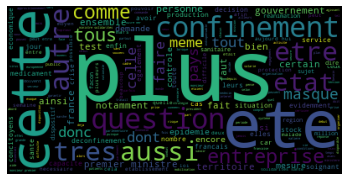

president richard ferrand rapporteur general chers collegues membres mission information reunis visioconference entendre premier ministre ministre solidarites sante monsieur premier ministre monsieur ministre tiens avant tout nom tous remercier avoir repondu rapidement demande etre presents aujourd hui devant mission information chacun sait ici mobilisation engagement tous instants comme celui membres gouvernement ensemble acteurs sous autorite faites face cette crise sans precedent agit fois tout faire ralentir progression virus notamment mesures confinement inedites apporter systeme soins sous tension acteurs tous moyens dont besoin enfin garantir malgre tout continuite activites indispensables vie francais permettez tout abord avoir pensee ensemble familles endeuillees tiens dire combien partageons peine comme partageons souffrances toutes celles tous ceux touches maladie inquietent proche douleur representants nation tout entiere agir mobiliser organiser repartir orchestrer cette l

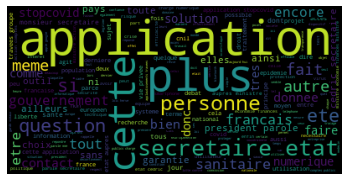

president ordre jour appelle declaration gouvernement suivie debat vote relative innovations numeriques lutte contre epidemie covid application article constitution preambule rappelle seance deroule conditions respect regles sanitaires mises place depuis mois mars hemicycle fait objet nettoyage desinfection avant apres chaque seance micros desinfectes apres chaque intervention invite chacune chacun veiller respect distances securite sorties salle seances devront exclusivement effectuer portes situees pourtour hemicycle rappelle egalement orateurs exprimeront depuis place sans monter tribune seance organisera trois temps apres declaration gouvernement parole donnee orateur chaque groupe ensuite apres eventuelle reponse gouvernement deroulera seance onze questions reponses enfin procederons vote scrutin public cette declaration application article reglement parole mme garde sceaux ministre justice mme nicole belloubet garde sceaux ministre justice monsieur president mesdames messieurs se

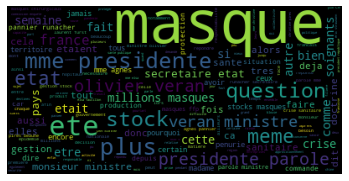

mme presidente ordre jour appelle questions decisions relatives gestion stocks masques rappelle conference presidents fixe deux minutes duree maximale chaque question chaque reponse parole jean christophe lagarde jean christophe lagarde monsieur ministre solidarites sante entre dit millions masques destines grand public soignants ete detruits affirme etait fait peremption alors realite plus souvent elastiques periment apparition moisissures bref stock constitue cours annees precedentes ete detruit resultat lorsque besoin masques plus conduit gouvernement expliquer successivement etaient necessaires puis forcement indispensables puis si faciles utiliser voit desormais rues france pourtant academie nationale medecine cote haut conseil sante publique autre indiquaient masques constituaient cas epidemie grave paiement assurance pouvant donner sentiment depense rien constituant autant protections individuelles fond question simple pourquoi lorsque masques ete detruits stocks ete reconstitue

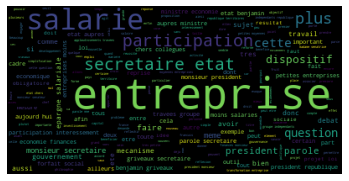

president ordre jour appelle debat organise demande groupe independants republique territoires theme participation entreprise outil croissance perspectives rappelle auteur debat disposera temps parole dix minutes compris replique puis gouvernement repondra vont tout abord exprimer orateurs groupe demande debat president parole secretaire etat benjamin griveaux secretaire etat aupres ministre economie finances monsieur president mesdames messieurs senateurs tres heureux etre ici crois muriel penicaud ministre travail egalement aime participer travaux sans doute beaucoup apprendre experience assurement role important jouer debats semaines mois viennent cette question centrale participation interessement entretien televise octobre president republique rappele cette question ferait objet grande reflexion cadre plan action croissance transformation entreprises dont bruno maire meme lance travaux lundi dernier hotel ministres bercy pourquoi utile revisiter dispositifs comme decool rappele qu

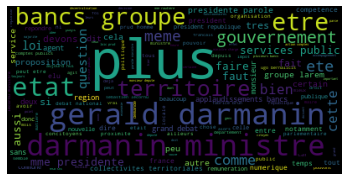

mme presidente ordre jour appelle debat organisation etat services publics conference presidents decide organiser debat deux parties premier temps entendrons orateurs groupes puis gouvernement procederons ensuite sequence questions reponses mme presidente parole ministre action comptes publics gerald darmanin ministre action comptes publics permettez tout abord remercier orateurs chacun groupes helas beaucoup entendu remerciements particulier part ceux critiquent action gouvernement agents services publics alors parlons avenir decisions prendrons collectivement travaillent chaque jour fonction publique territoriale etat sante bien etre concitoyens applaudissements bancs groupe larem plusieurs bancs groupe lr critique facile remercier parfois difficile ugo bernalicis jour aussi remercie monsieur ministre gerald darmanin ministre vrai agents services publics sous tous gouvernements republique singulierement gouvernement car demandons beaucoup temoignent engagement republicain cheville co

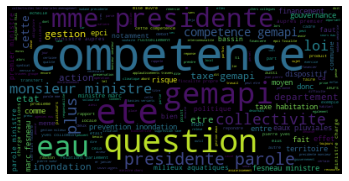

mme presidente ordre jour appelle debat organise demande groupe rassemblement democratique social europeen theme bilan perspectives competence gestion milieux aquatiques prevention inondations allons proceder debat sous forme serie questions reponses dont modalites ete fixees conference presidents rappelle auteur demande dispose temps parole huit minutes puis gouvernement repond duree equivalente mme presidente parole ministre marc fesneau ministre aupres premier ministre charge relations parlement madame presidente mesdames messieurs senateurs vu aleas climatiques face risques crues intensite leurs effets logique gemapi forte solidaire gestion cours eau celle risque inondation liees elles obligent penser conserve gestion zones extension naturelle crues entretien ouvrages protection contre inondations appelle defi technique ingenierie financier raison laquelle gestion eau prevention inondations devaient etre rapprochees donc heureux debat aujourd hui sujet loi janvier modernisation act

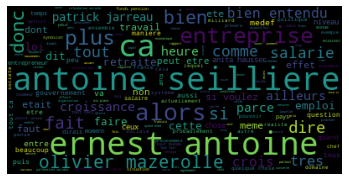

olivier mazerolle bonsoir monsieur seilliere croissance rendez forte stimulante amene gouvernement revoir previsions hausse confirmer intention baisser prelevements obligatoires moins point cette annee contexte medef engage syndicats negociations approfondies changer dialogue social proposition innovante suscite aussi craintes certes entreprises attendent bien changements salaries gagner dont allons parler grand jury auquel participe anita hausser patrick jarreau grand jury retransmis direct rtl lci monde publiera edition demain essentiel declarations monsieur seilliere vendredi dernier premiere fois depuis plus deux ans depuis coup tonnerre heures octobre etes retrouves syndicats autour premier ministre lionel jospin parler doivent etre rapports sociaux alors pacification vue rapports entre medef gouvernement ernest antoine seilliere aspirons bien entendu retrouver pleinement role partenaire social representant entrepreneurs jouant pleinement parti societe francaise representons fond 

In [ ]:
# The first results of the new articles  
txt_wordcloud(bow_g3, score_forest_g3, data_bow_g3)

## 2) One SVM of G3

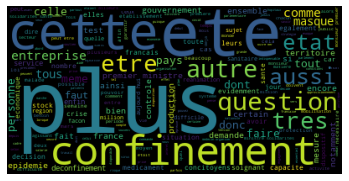

president richard ferrand rapporteur general chers collegues membres mission information reunis visioconference entendre premier ministre ministre solidarites sante monsieur premier ministre monsieur ministre tiens avant tout nom tous remercier avoir repondu rapidement demande etre presents aujourd hui devant mission information chacun sait ici mobilisation engagement tous instants comme celui membres gouvernement ensemble acteurs sous autorite faites face cette crise sans precedent agit fois tout faire ralentir progression virus notamment mesures confinement inedites apporter systeme soins sous tension acteurs tous moyens dont besoin enfin garantir malgre tout continuite activites indispensables vie francais permettez tout abord avoir pensee ensemble familles endeuillees tiens dire combien partageons peine comme partageons souffrances toutes celles tous ceux touches maladie inquietent proche douleur representants nation tout entiere agir mobiliser organiser repartir orchestrer cette l

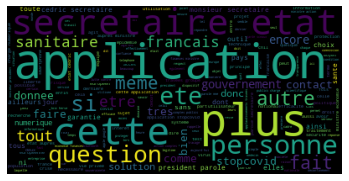

president ordre jour appelle declaration gouvernement suivie debat vote relative innovations numeriques lutte contre epidemie covid application article constitution preambule rappelle seance deroule conditions respect regles sanitaires mises place depuis mois mars hemicycle fait objet nettoyage desinfection avant apres chaque seance micros desinfectes apres chaque intervention invite chacune chacun veiller respect distances securite sorties salle seances devront exclusivement effectuer portes situees pourtour hemicycle rappelle egalement orateurs exprimeront depuis place sans monter tribune seance organisera trois temps apres declaration gouvernement parole donnee orateur chaque groupe ensuite apres eventuelle reponse gouvernement deroulera seance onze questions reponses enfin procederons vote scrutin public cette declaration application article reglement parole mme garde sceaux ministre justice mme nicole belloubet garde sceaux ministre justice monsieur president mesdames messieurs se

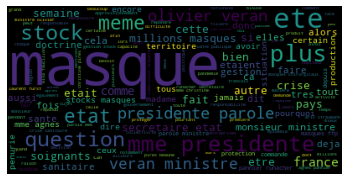

mme presidente ordre jour appelle questions decisions relatives gestion stocks masques rappelle conference presidents fixe deux minutes duree maximale chaque question chaque reponse parole jean christophe lagarde jean christophe lagarde monsieur ministre solidarites sante entre dit millions masques destines grand public soignants ete detruits affirme etait fait peremption alors realite plus souvent elastiques periment apparition moisissures bref stock constitue cours annees precedentes ete detruit resultat lorsque besoin masques plus conduit gouvernement expliquer successivement etaient necessaires puis forcement indispensables puis si faciles utiliser voit desormais rues france pourtant academie nationale medecine cote haut conseil sante publique autre indiquaient masques constituaient cas epidemie grave paiement assurance pouvant donner sentiment depense rien constituant autant protections individuelles fond question simple pourquoi lorsque masques ete detruits stocks ete reconstitue

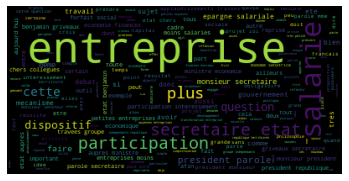

president ordre jour appelle debat organise demande groupe independants republique territoires theme participation entreprise outil croissance perspectives rappelle auteur debat disposera temps parole dix minutes compris replique puis gouvernement repondra vont tout abord exprimer orateurs groupe demande debat president parole secretaire etat benjamin griveaux secretaire etat aupres ministre economie finances monsieur president mesdames messieurs senateurs tres heureux etre ici crois muriel penicaud ministre travail egalement aime participer travaux sans doute beaucoup apprendre experience assurement role important jouer debats semaines mois viennent cette question centrale participation interessement entretien televise octobre president republique rappele cette question ferait objet grande reflexion cadre plan action croissance transformation entreprises dont bruno maire meme lance travaux lundi dernier hotel ministres bercy pourquoi utile revisiter dispositifs comme decool rappele qu

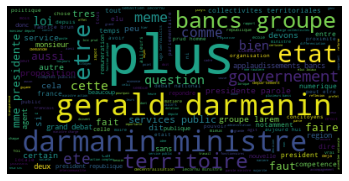

mme presidente ordre jour appelle debat organisation etat services publics conference presidents decide organiser debat deux parties premier temps entendrons orateurs groupes puis gouvernement procederons ensuite sequence questions reponses mme presidente parole ministre action comptes publics gerald darmanin ministre action comptes publics permettez tout abord remercier orateurs chacun groupes helas beaucoup entendu remerciements particulier part ceux critiquent action gouvernement agents services publics alors parlons avenir decisions prendrons collectivement travaillent chaque jour fonction publique territoriale etat sante bien etre concitoyens applaudissements bancs groupe larem plusieurs bancs groupe lr critique facile remercier parfois difficile ugo bernalicis jour aussi remercie monsieur ministre gerald darmanin ministre vrai agents services publics sous tous gouvernements republique singulierement gouvernement car demandons beaucoup temoignent engagement republicain cheville co

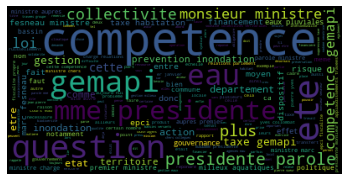

mme presidente ordre jour appelle debat organise demande groupe rassemblement democratique social europeen theme bilan perspectives competence gestion milieux aquatiques prevention inondations allons proceder debat sous forme serie questions reponses dont modalites ete fixees conference presidents rappelle auteur demande dispose temps parole huit minutes puis gouvernement repond duree equivalente mme presidente parole ministre marc fesneau ministre aupres premier ministre charge relations parlement madame presidente mesdames messieurs senateurs vu aleas climatiques face risques crues intensite leurs effets logique gemapi forte solidaire gestion cours eau celle risque inondation liees elles obligent penser conserve gestion zones extension naturelle crues entretien ouvrages protection contre inondations appelle defi technique ingenierie financier raison laquelle gestion eau prevention inondations devaient etre rapprochees donc heureux debat aujourd hui sujet loi janvier modernisation act

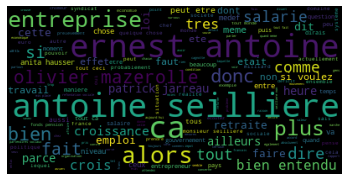

olivier mazerolle bonsoir monsieur seilliere croissance rendez forte stimulante amene gouvernement revoir previsions hausse confirmer intention baisser prelevements obligatoires moins point cette annee contexte medef engage syndicats negociations approfondies changer dialogue social proposition innovante suscite aussi craintes certes entreprises attendent bien changements salaries gagner dont allons parler grand jury auquel participe anita hausser patrick jarreau grand jury retransmis direct rtl lci monde publiera edition demain essentiel declarations monsieur seilliere vendredi dernier premiere fois depuis plus deux ans depuis coup tonnerre heures octobre etes retrouves syndicats autour premier ministre lionel jospin parler doivent etre rapports sociaux alors pacification vue rapports entre medef gouvernement ernest antoine seilliere aspirons bien entendu retrouver pleinement role partenaire social representant entrepreneurs jouant pleinement parti societe francaise representons fond 

In [ ]:
# The first results of the new articles  
txt_wordcloud(bow_g3, score_svm_g3, data_bow_g3)

**Conclusion :**  
It can be seen that there is one item that is present in both unsupervised classification models as a document providing new information.   
As for the other articles found, they are quite different. Nevertheless, there are a few themes that come up again, such as "La Covid" talking about the announcements of a president or prime minister but also about containment, ... etc.

# Method 2 (v1):

**Methodology :**  
We chose to keep the BoW of group 3 as a vector representation because it was the one with the best results.  
For this second method, we decided to carry out a size reduction with t-distributed Stochastic Neighbor Embedding (t-SNE) on our BoW. Then to apply one of the unsupervised algorithms used in the first part (LOF, Isolation Forest and One SVM).

## 1) Dimension reduction with t-SNE

In [ ]:
# Normalisation
sc: StandardScaler = StandardScaler()
X: np.ndarray = sc.fit_transform(bow_g3)
# t-SNE
tsne: TSNE = TSNE(n_components=3)
X: np.ndarray = tsne.fit_transform(X)

## 2) Unsupervised classification model
  
###a) Local Outlier Facor (LOF)

In [ ]:
# Prediction BoW-G3 with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=2, contamination=0.1)
pred: np.ndarray = clf.fit_predict(X)
pd.Series(pred).value_counts()

 1    6779
-1     754
dtype: int64

In [ ]:
graphs(X, pred, '2d')

In [ ]:
graphs(X, pred, '3d')

### b) One Support Vector Machine (One SVM)

In [ ]:
# Prediction BoW-G3 with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(X)
pred: np.ndarray = one_svm.predict(X)
pd.Series(pred).value_counts()

 1    5906
-1    1627
dtype: int64

In [ ]:
graphs(X, pred, '2d')

In [ ]:
graphs(X, pred, '3d')

### c) Isolation Forest

#### **> The first result**

In [ ]:
# Prediction BoW-G3 with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.01)
pred: np.ndarray = clf.fit_predict(X)
score: np.ndarray = clf.decision_function(X)
pd.Series(pred).value_counts()

 1    7457
-1      76
dtype: int64

In [ ]:
graphs(X, pred, '2d')

In [ ]:
graphs(X, pred, '3d')

#### **> The result by selecting fewer new items**

In [ ]:
# Prediction BoW-G3 with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.003)
pred: np.ndarray = clf.fit_predict(X)
score: np.ndarray = clf.decision_function(X)
pd.Series(pred).value_counts()

 1    7510
-1      23
dtype: int64

In [ ]:
graphs(X, pred, '3d')

## 3) Word cloud for Isolation forest (because best results just before)
  
The results are inconclusive for the LOF and One SVM. However, for the Isolation Forest all atypical articles were taken into account.  
And even if the number of new articles selected is reduced, the results are still as good and above all we detect far fewer duplicate articles.

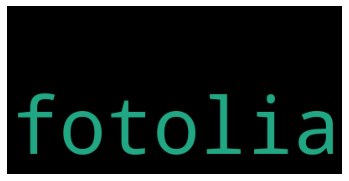

fotolia com
None


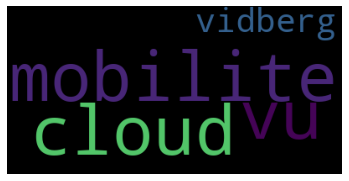

mobilite cloud vu vidberg
None


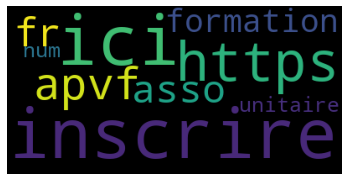

inscrire ici https www apvf asso fr formation unitaire num
None


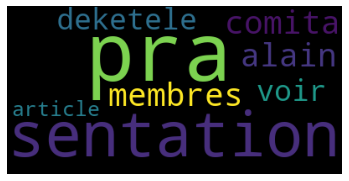

pra©sentation membres comita© alain deketele voir article
None


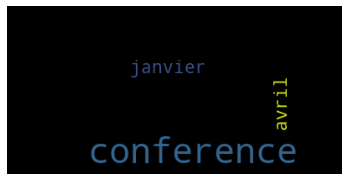

conference janvier conference avril
None


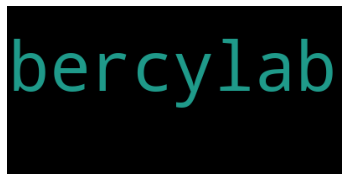

bercylab
None


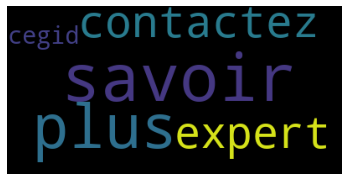

savoir plus contactez expert cegid
None


In [ ]:
# The first results of the new articles  
txt_wordcloud(bow_g3, score, data_bow_g3)

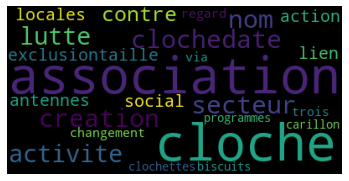

nom clochedate creation secteur activite lutte contre exclusiontaille association antennes locales cloche action association lien social changement regard via trois programmes carillon cloche biscuits clochettes
None


In [ ]:
# One text and its word cloud
# Create a new dataframe with the score
df = bow_g3.copy()
df['index'] = bow_g3.index
df['score'] = score

# Retrieve the text of the articles
mycolumns = ['art_id', 'art_content_clean_without_lem']
data_bow = data_bow_g3[mycolumns]

# Merge the text with its decision score
df_new = pd.merge(data_bow, df, left_on='art_id', right_on='index')

# Sort scores from smallest to largest
df_sort = df_new.sort_values(by='score')
df_sort = df_sort.reset_index()
df_sort = df_sort.drop(['level_0'], axis=1)

txt = df_sort['art_content_clean_without_lem'][20]
wordcloud = wordcloud_art(txt)
print(txt)
print(wordcloud)

# Conclusion  
  
The first results obtained are very short texts. An article with very little information it is more difficult to find a link with others, which seems coherent.  
  
If we try to look at the articles that have emerged from the classification model with a little more content :  
About for the first 30 articles that came out of the model, the results are different (they do not evoke the same information). Moreover, no text speaks of "La covid" or mentions a link with it, such as containment, ... for example.
  
So, we can conclude that in order to find the documents bringing new information, it is the second method that brings us the best results.  
  
Nevertheless, the results obtained depend on the scrapped articles (about 7000) but also on the representations we chose and could have been much better if we had had more documents.